adham jaber 204218184

link to video - https://drive.google.com/file/d/1mLgkxe3pLZppIJUJQpFI-YEc-UZZOR8_/view?usp=sharing

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, accuracy_score
import matplotlib.pyplot as plt
import lightgbm as lgb
import numpy as np
import seaborn as sns
from datetime import datetime

In [ ]:
from google.colab import drive
drive.mount('/gdrive')



In [ ]:
df = pd.read_csv("/gdrive/MyDrive/shenkar/3rd year/python/games.csv")
df.describe()

,created_at,last_move_at,turns,white_rating,black_rating,opening_ply
count,2.005800e+04,2.005800e+04,20058.000000,20058.000000,20058.000000,20058.000000
mean,1.483617e+12,1.483618e+12,60.465999,1596.631868,1588.831987,4.816981
std,2.850151e+10,2.850140e+10,33.570585,291.253376,291.036126,2.797152
min,1.376772e+12,1.376772e+12,1.000000,784.000000,789.000000,1.000000
25%,1.477548e+12,1.477548e+12,37.000000,1398.000000,1391.000000,3.000000
50%,1.496010e+12,1.496010e+12,55.000000,1567.000000,1562.000000,4.000000
75%,1.503170e+12,1.503170e+12,79.000000,1793.000000,1784.000000,6.000000
max,1.504493e+12,1.504494e+12,349.000000,2700.000000,2723.000000,28.000000



# Intro


The goal of this project is to predict who will win (black/white) in a chess match based on the features given.
Chess Game Dataset is dataset around 20000 matches on lichess.org (online platform where registed players can play against each other and gain rating by winnning games) and over 1500 players, the dataset includes data about the game itself and about the players.

## **The Dataset**

the dataset has 20000 matches and 16 features :

*string*
* id  -  the match ID string
* white_id - the id of the white player string
* black_id - the ID of the black player string
* moves - the moves made during the game

*Numeric*
* rated - if match is rated boolean
* created_at - what time the game was created unix time
* last_move_at - what time the game was created unix time
* turns - how many turns have been played in the match
* white_rating - rating of white player based of previus matches
* black_rating - rating of black player based of previus matches
* opening_ply - length of the opening strategy in turns

*Categorical*
* vicory_status - how the matche ended [draw,mate,out of time,resign] 
* winner - which player won [white,black,draw]
* increment_code - An amount of time added to the clock after each move is made
* opening_eco - classification system for the chess openings moves
* opening_name - opening strategy name 


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20058 non-null  object 
 1   rated           20058 non-null  bool   
 2   created_at      20058 non-null  float64
 3   last_move_at    20058 non-null  float64
 4   turns           20058 non-null  int64  
 5   victory_status  20058 non-null  object 
 6   winner          20058 non-null  object 
 7   increment_code  20058 non-null  object 
 8   white_id        20058 non-null  object 
 9   white_rating    20058 non-null  int64  
 10  black_id        20058 non-null  object 
 11  black_rating    20058 non-null  int64  
 12  moves           20058 non-null  object 
 13  opening_eco     20058 non-null  object 
 14  opening_name    20058 non-null  object 
 15  opening_ply     20058 non-null  int64  
dtypes: bool(1), float64(2), int64(4), object(9)
memory usage: 2.3+ MB


# Initial Data Analysis


##Handling missin data

In [ ]:
df.head()

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.504110e+12,1.504110e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.504030e+12,1.504030e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5


Check the percentage of corrupted data

In [ ]:
df.describe()

,created_at,last_move_at,turns,white_rating,black_rating,opening_ply
count,2.005800e+04,2.005800e+04,20058.000000,20058.000000,20058.000000,20058.000000
mean,1.483617e+12,1.483618e+12,60.465999,1596.631868,1588.831987,4.816981
std,2.850151e+10,2.850140e+10,33.570585,291.253376,291.036126,2.797152
min,1.376772e+12,1.376772e+12,1.000000,784.000000,789.000000,1.000000
25%,1.477548e+12,1.477548e+12,37.000000,1398.000000,1391.000000,3.000000
50%,1.496010e+12,1.496010e+12,55.000000,1567.000000,1562.000000,4.000000
75%,1.503170e+12,1.503170e+12,79.000000,1793.000000,1784.000000,6.000000
max,1.504493e+12,1.504494e+12,349.000000,2700.000000,2723.000000,28.000000


In [ ]:
df.isnull().sum()

id                0
rated             0
created_at        0
last_move_at      0
turns             0
victory_status    0
winner            0
increment_code    0
white_id          0
white_rating      0
black_id          0
black_rating      0
moves             0
opening_eco       0
opening_name      0
opening_ply       0
dtype: int64

id                0.0
rated             0.0
created_at        0.0
last_move_at      0.0
turns             0.0
victory_status    0.0
winner            0.0
increment_code    0.0
white_id          0.0
white_rating      0.0
black_id          0.0
black_rating      0.0
moves             0.0
opening_eco       0.0
opening_name      0.0
opening_ply       0.0
dtype: float64

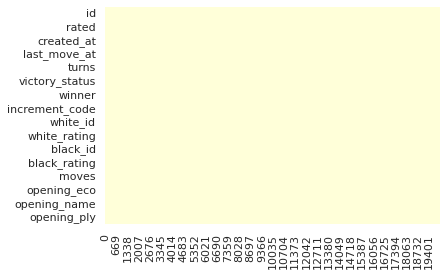

In [ ]:
percent_missing = df. isnull().mean() * 100

sns.heatmap(df.isnull().transpose(),cmap="YlGnBu",cbar=False)
display(percent_missing)

As we can see we dont have any corrupted or missing data in the dataframe

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20058 non-null  object 
 1   rated           20058 non-null  bool   
 2   created_at      20058 non-null  float64
 3   last_move_at    20058 non-null  float64
 4   turns           20058 non-null  int64  
 5   victory_status  20058 non-null  object 
 6   winner          20058 non-null  object 
 7   increment_code  20058 non-null  object 
 8   white_id        20058 non-null  object 
 9   white_rating    20058 non-null  int64  
 10  black_id        20058 non-null  object 
 11  black_rating    20058 non-null  int64  
 12  moves           20058 non-null  object 
 13  opening_eco     20058 non-null  object 
 14  opening_name    20058 non-null  object 
 15  opening_ply     20058 non-null  int64  
dtypes: bool(1), float64(2), int64(4), object(9)
memory usage: 2.3+ MB


In [ ]:
df.drop_duplicates(subset='id',inplace=False,keep = 'first')

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.504110e+12,1.504110e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.504030e+12,1.504030e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20053,EfqH7VVH,True,1.499791e+12,1.499791e+12,24,resign,white,10+10,belcolt,1691,jamboger,1220,d4 f5 e3 e6 Nf3 Nf6 Nc3 b6 Be2 Bb7 O-O Be7 Ne5...,A80,Dutch Defense,2
20054,WSJDhbPl,True,1.499698e+12,1.499699e+12,82,mate,black,10+0,jamboger,1233,farrukhasomiddinov,1196,d4 d6 Bf4 e5 Bg3 Nf6 e3 exd4 exd4 d5 c3 Bd6 Bd...,A41,Queen's Pawn,2
20055,yrAas0Kj,True,1.499698e+12,1.499698e+12,35,mate,white,10+0,jamboger,1219,schaaksmurf3,1286,d4 d5 Bf4 Nc6 e3 Nf6 c3 e6 Nf3 Be7 Bd3 O-O Nbd...,D00,Queen's Pawn Game: Mason Attack,3
20056,b0v4tRyF,True,1.499696e+12,1.499697e+12,109,resign,white,10+0,marcodisogno,1360,jamboger,1227,e4 d6 d4 Nf6 e5 dxe5 dxe5 Qxd1+ Kxd1 Nd5 c4 Nb...,B07,Pirc Defense,4


Dropping all duplicated games

##Changing columns to category type




In [ ]:
df['winner']=df['winner'].astype('category')
df['opening_name']=df['opening_name'].astype('category')
df['opening_eco']=df['opening_eco'].astype('category')
df['increment_code']=df['increment_code'].astype('category')
df['victory_status']=df['victory_status'].astype('category')
df['rated']=df['rated'].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   id              20058 non-null  object  
 1   rated           20058 non-null  category
 2   created_at      20058 non-null  float64 
 3   last_move_at    20058 non-null  float64 
 4   turns           20058 non-null  int64   
 5   victory_status  20058 non-null  category
 6   winner          20058 non-null  category
 7   increment_code  20058 non-null  category
 8   white_id        20058 non-null  object  
 9   white_rating    20058 non-null  int64   
 10  black_id        20058 non-null  object  
 11  black_rating    20058 non-null  int64   
 12  moves           20058 non-null  object  
 13  opening_eco     20058 non-null  category
 14  opening_name    20058 non-null  category
 15  opening_ply     20058 non-null  int64   
dtypes: category(6), float64(2), int64(4), object(4)
memory usa

##Adding new columns and outliers

We can see that the opening_name column have 1477 categories

In [ ]:
df['opening_name'].unique

<bound method Series.unique of 0              Slav Defense: Exchange Variation
1        Nimzowitsch Defense: Kennedy Variation
2         King's Pawn Game: Leonardis Variation
3        Queen's Pawn Game: Zukertort Variation
4                              Philidor Defense
                          ...                  
20053                             Dutch Defense
20054                              Queen's Pawn
20055           Queen's Pawn Game: Mason Attack
20056                              Pirc Defense
20057           Queen's Pawn Game: Mason Attack
Name: opening_name, Length: 20058, dtype: category
Categories (1477, object): ['Alekhine Defense', 'Alekhine Defense #2', 'Alekhine Defense #3',
                            'Alekhine Defense: Balogh Variation', ..., 'Zukertort Opening: Tennison Gambit',
                            'Zukertort Opening: The Walrus', 'Zukertort Opening: Vos Gambit',
                            'Zukertort Opening: Wade Defense']>

In [ ]:

new_col=df['opening_name'].apply(lambda row:row.split(':')[0])
new_col
df['general_openings']=new_col
df['general_openings']=df['general_openings'].astype('category')

Added a general opening name column so it would be easier later on because i can see that we have opening name and the variation of that opening
example:
*   Queen's Pawn Game: Zukertort Variation  --> Queen's Pawn Game
*   Sicilian Defense: Smith-Morra Gambit #2 --> Sicilian Defense
*   Sicilian Defense: Dragon Variation      --> Sicilian Defense
*   Sicilian Defense: Bowdler Attack        --> Sicilian Defense

and by grouping them in larger groups by the opening name without the variation we will have less groups and can use it later to find a correlation with other featurs.


In [ ]:
df['general_openings'].unique

<bound method Series.unique of 0               Slav Defense
1        Nimzowitsch Defense
2           King's Pawn Game
3          Queen's Pawn Game
4           Philidor Defense
                ...         
20053          Dutch Defense
20054           Queen's Pawn
20055      Queen's Pawn Game
20056           Pirc Defense
20057      Queen's Pawn Game
Name: general_openings, Length: 20058, dtype: category
Categories (227, object): ['Alekhine Defense', 'Alekhine Defense #2', 'Alekhine Defense #3',
                           'Amar Opening', ..., 'Ware Defense', 'Ware Opening',
                           'Yusupov-Rubinstein System', 'Zukertort Opening']>

Now we have 227 categories
that maybe can help us predict the winner base on this feature

Change created_at and last_move_at columns from unix timestamp to readable date

In [ ]:
readable_time=df['created_at'].apply(lambda row:datetime.fromtimestamp(row/1000))
df['created_at']=readable_time

In [ ]:
readable_time_end=df['last_move_at'].apply(lambda row:datetime.fromtimestamp(row/1000))
df['last_move_at']=readable_time_end

In [ ]:
game_duration=df['last_move_at']-df['created_at']
game_duration.fillna(pd.Timedelta(seconds=0))
game_duration=game_duration.dt.total_seconds()/60
game_duration=game_duration.astype(float)
df['game_duration']=game_duration



In [ ]:
df['game_duration'].describe()

count    20058.000000
mean        14.495117
std         80.237035
min          0.000000
25%          0.000000
50%          4.010200
75%         13.219521
max      10097.411683
Name: game_duration, dtype: float64

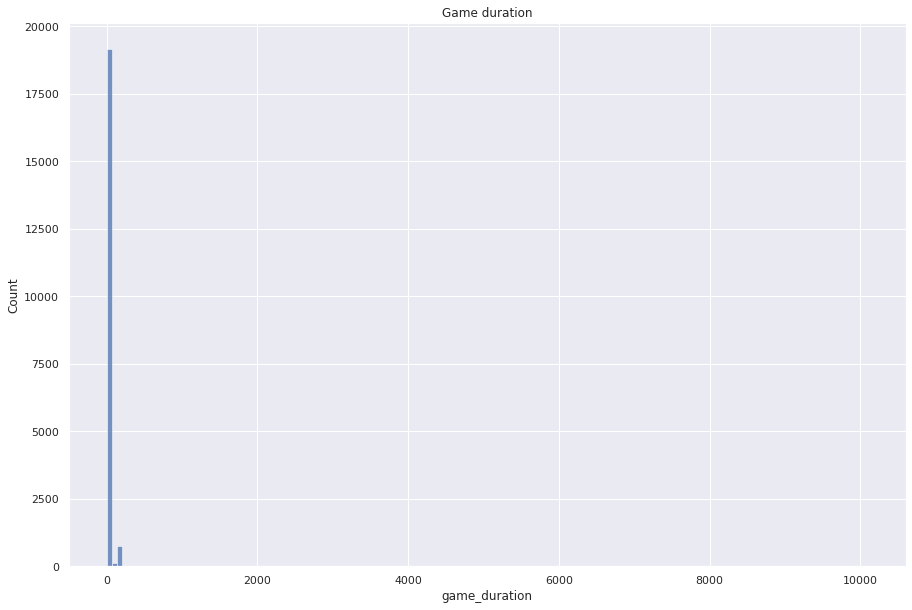

In [ ]:
plt.figure(figsize=[15,10])
sns.histplot(data=df , x="game_duration", bins=150,).set(title='Game duration')
plt.show()


We can see that almost all of the data is small numbers but we have some outlaiers.

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


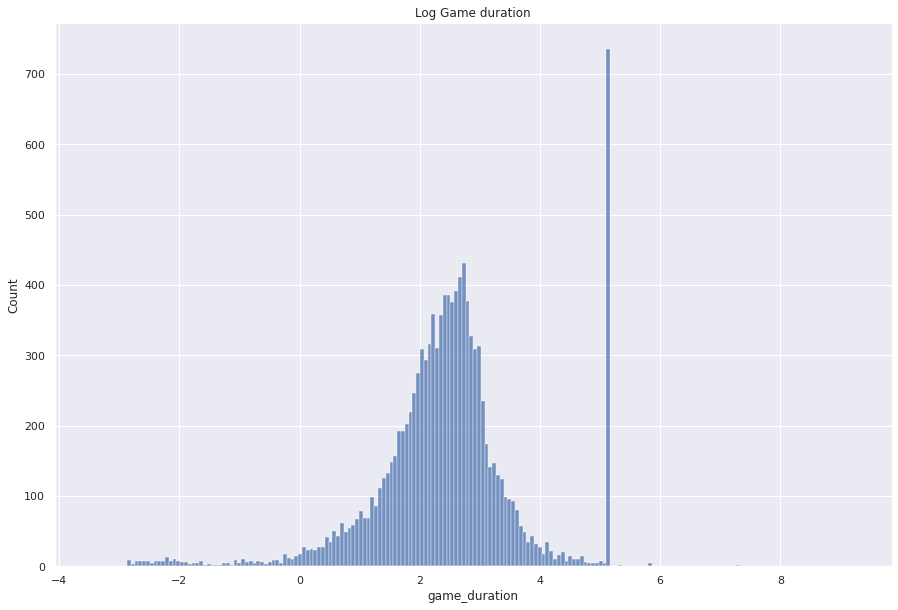

In [ ]:
plt.figure(figsize=[15,10])
sns.histplot(np.log(df.game_duration), bins=200, kde=False).set(title='Log Game duration')
plt.show()

We can see here that we have big ammount of games that have the same game duration, that can point to curropted data

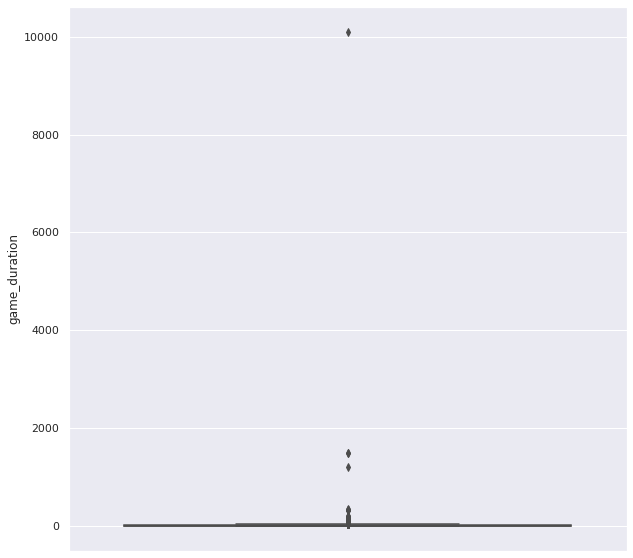

In [ ]:
plt.figure(figsize=[10,10])

sns.boxplot(y="game_duration",data=df)


In [ ]:
df[df['game_duration']>1000]

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply,general_openings,game_duration
5852,3STx4QDX,False,2016-03-28 04:40:00.000,2016-03-29 05:40:00.000,72,draw,draw,30+0,grundlesniffer,1370,tomo1997,1500,e4 e5 Nf3 Bc5 c3 b5 d4 Bb6 Bxb5 a6 Bc4 Nc6 O-O...,C40,King's Pawn Game: Busch-Gass Gambit,4,King's Pawn Game,1500.000000
7918,TjurH9Gx,False,2015-11-26 23:20:00.000,2015-11-28 00:20:00.000,2,outoftime,black,15+0,slimes1,1500,baccola89,1382,d4 d5,D00,Queen's Pawn Game,2,Queen's Pawn Game,1500.000000
10754,eyhzu8aj,False,2014-01-16 14:32:13.749,2014-01-23 14:49:38.450,35,resign,white,180+180,towhen,1245,miladghasemi,1011,d4 f6 Nf3 e5 e3 Nc6 Nc3 d5 Nb5 Qd7 Bd2 a6 Na3 ...,A40,Queen's Pawn,1,Queen's Pawn,10097.411683
17094,gD7a4WY8,True,2017-04-25 14:26:10.794,2017-04-26 10:32:00.184,2,outoftime,black,14+2,thegasmask,1383,mertoksuz,1522,c4 e5,A20,English Opening: King's English Variation,2,English Opening,1205.823167


we can see that we have 4 games that took more than 1000 minutes

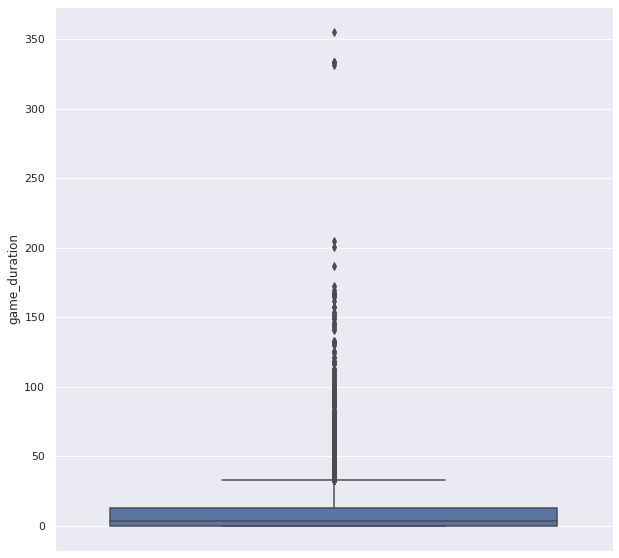

In [ ]:
plt.figure(figsize=[10,10])

sns.boxplot(y="game_duration",data=df[df['game_duration']<1000])

Even after taking some extreme outliners out we can still see that most of the games ened close to 0 minuts

In [ ]:
display(df[df['game_duration']==0]['game_duration'])


0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
9282    0.0
9283    0.0
9284    0.0
9285    0.0
9286    0.0
Name: game_duration, Length: 8548, dtype: float64

We can see from the last section that almost half (8548)  of the games lasted 0 minuts
So i cannot use this data because its not enught to use or to relay on 
We can delete the "created_at" & last_move_at" column because we are not going to use them in our analysis

In [ ]:
del df['game_duration']
del df['created_at']
del df['last_move_at']
del df['moves']

Also deleted the moves column, im not soing to use it in my analysis 

check outliers in turns column

In [ ]:
#game duration
df['turns'].mean()

60.46599860404826

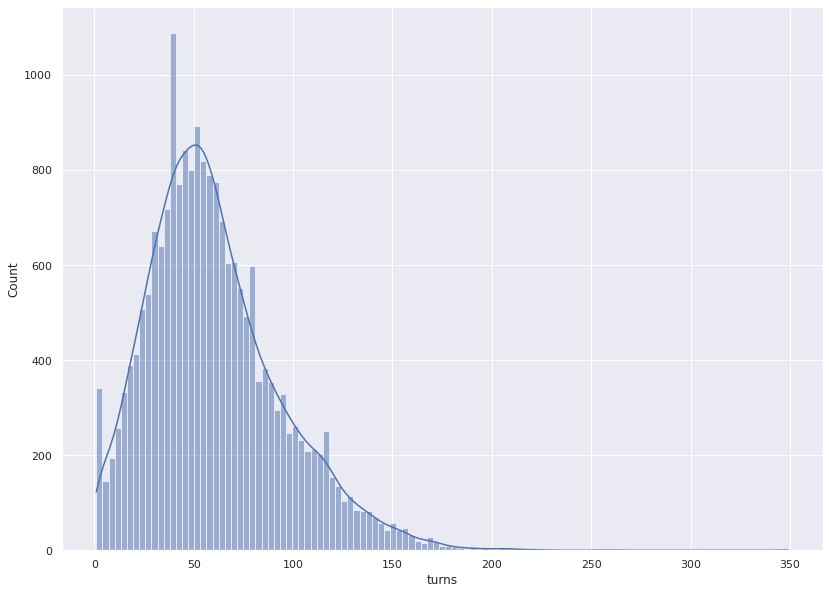

In [ ]:
#Plot showing turns and games
plt.figure(figsize=[30,10])
plt.subplot(1, 2, 1)
sns.histplot(df.turns,  kde=True)



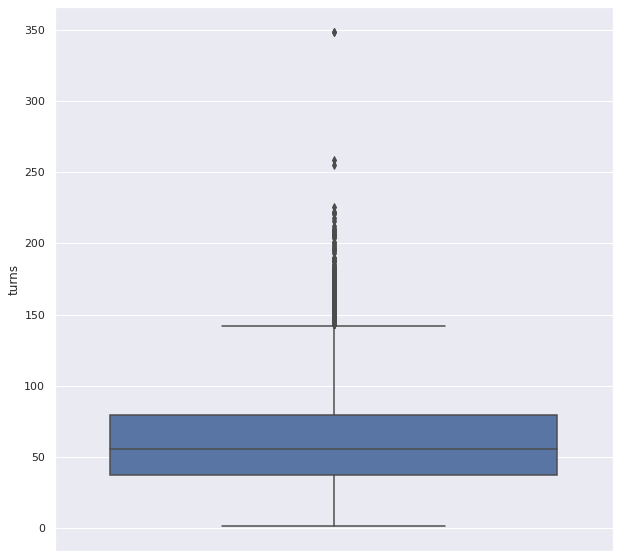

In [ ]:
plt.figure(figsize=[10,10])
sns.boxplot(data=df,y='turns')

In [ ]:
df=df[df['turns']<250]

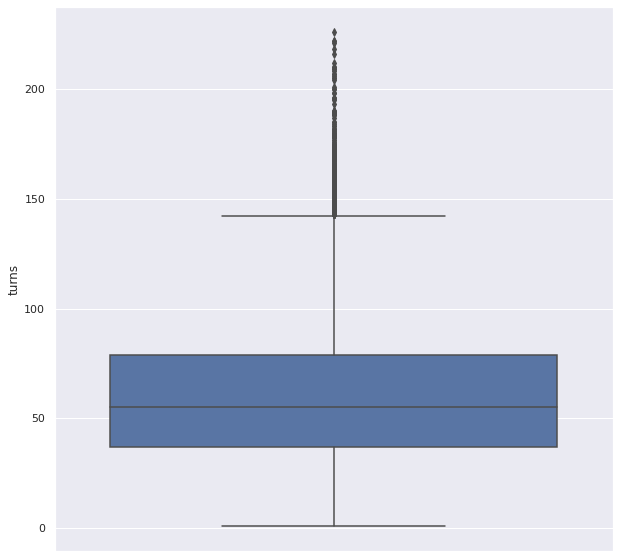

In [ ]:
plt.figure(figsize=[10,10])
sns.boxplot(data=df,y='turns')

Delete games that had more than 250 turns, we only had a few games.
but i dont want to delete all of the outliers because there are matches that  take more turns than usual its a chess game if we take high rated players the match can take a lot more tha ususal and we should take in in considiration.

Adding rating difference (white_rate - black_rate)
that means if the rating_diff is negative that means black player has more rating than white and the other way around as awell.

In [ ]:
df['rating_diff']=df['white_rating']-df['black_rating']

In [ ]:
df.to_csv('chess_clean.csv')

## Summary

**Summary:**
  

*   our dataset is clean i did not find missing data.
*   i tried to add game duration column but as we can see big ammount of the data was 0, in my opinion i cannot use this data and trying to manipulate with almos half of the data value close to 0 is not a good idea and it would not help my analysis. 

*   found some duplicated columns and dropped them
*   changed column types to categorialso i can  analyse and make correlation 
*   added rating difference column, im going to use it later on in my analysis
*   added general_openings column to make groups of games with the same opening strategy



   

# Exploratory Data Analysis


## analysis on featurs

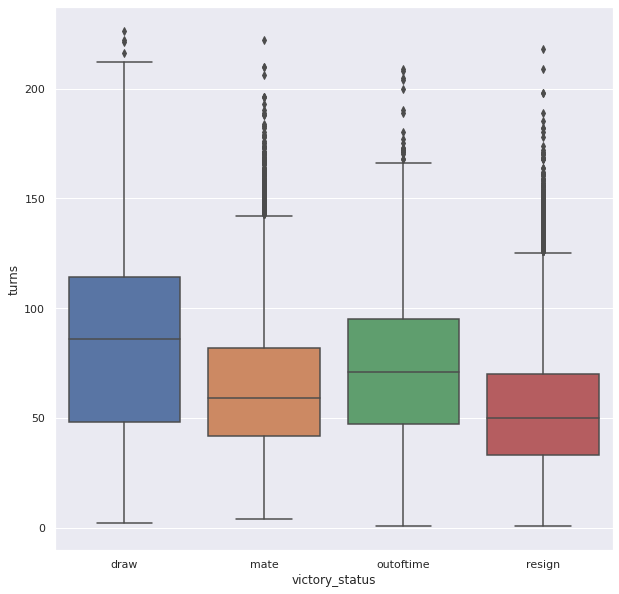

In [ ]:
plt.figure(figsize=[10,10])
sns.boxplot(x="victory_status",y="turns",data=df)     #['outoftime', 'resign', 'mate', 'draw'] to [0,1,2,3] in order

we can see from this plot 
1.   Most outoftime games happened between 50-100 turns
2.   resign and mate accure around 50 turns but we have some games that lasted more until 200 turns but they are 
3.   The games that ended in draw took more turns than other






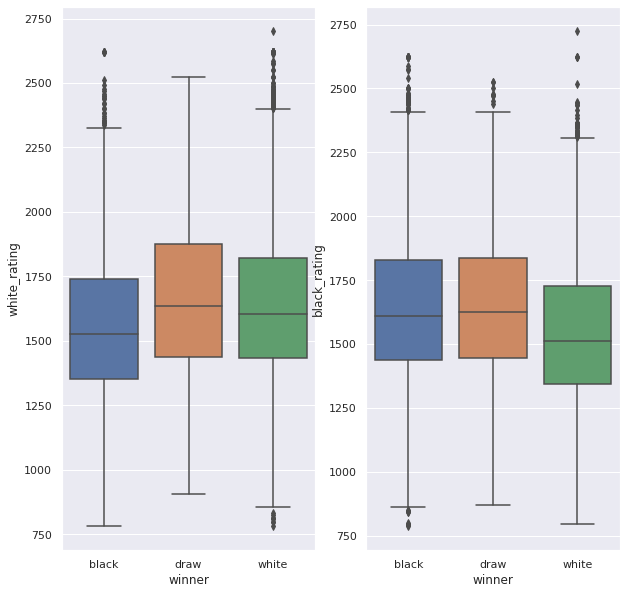

In [ ]:
plt.figure(figsize=[10,10])
plt.subplot(1, 2, 1)
sns.boxplot(x='winner',y='white_rating',data=df)  
plt.subplot(1, 2, 2)
sns.boxplot(x='winner', y='black_rating',data=df)

we can learn a lot from these plots

1.   When the games end in draw white rating i slightly more
2.   when the games are won by one of the players we can see that the winner rating is higher than the looser rating and this ca help us later on with out predictions



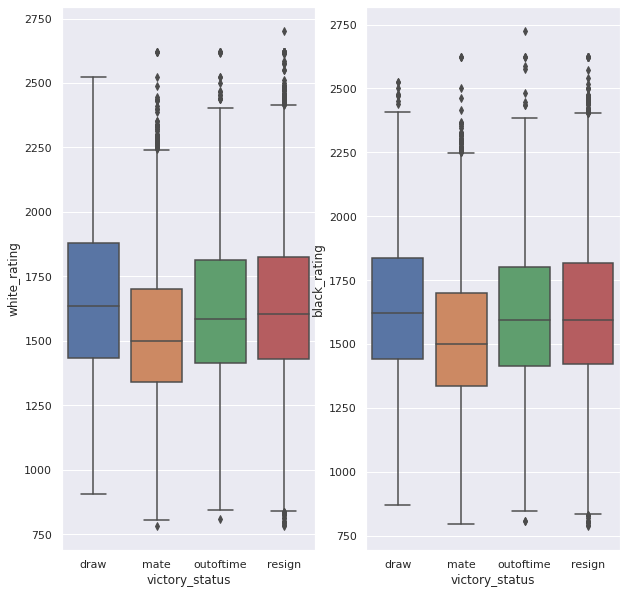

In [ ]:
plt.figure(figsize=[10,10])
plt.subplot(1, 2, 1)
sns.boxplot(x='victory_status',y='white_rating',data=df)   #['outoftime', 'resign', 'mate', 'draw'] to [0,1,2,3] in order
plt.subplot(1, 2, 2)
sns.boxplot(x='victory_status',y='black_rating',data=df)

We can clearly see from these plots that games that ended in mate have lower rating, that indicats that maybe new players dont resign or draw, 
but more expirienced players know when the game is lost and they respectfuly resign the game instad of dragging the game.

We can also see outliers but im not going to delete them because it is possible to have some few players with high rating and they shoudn not be excluded 

the mean is :  4.816246135434327


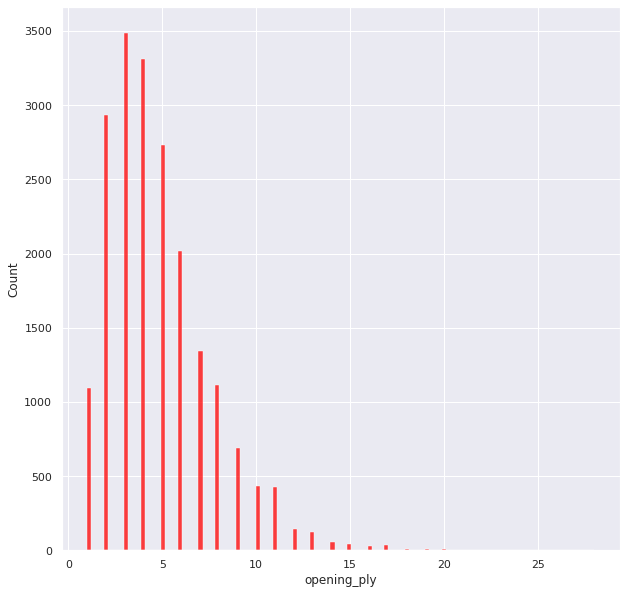

In [ ]:

plt.figure(figsize=[10,10])
sns.set(style="darkgrid")
sns.histplot(df.opening_ply,label="opening duration",color="red")
print("the mean is : ",df['opening_ply'].mean())

Distribution of the length of the opening turns

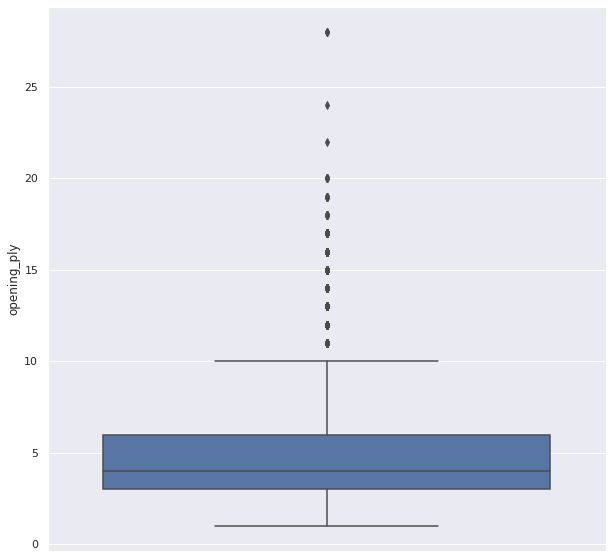

In [ ]:
plt.figure(figsize=[10,10])
sns.boxplot(y="opening_ply",data=df)

In [ ]:
df[df['opening_ply'] > 20]

,id,rated,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,opening_eco,opening_name,opening_ply,general_openings,rating_diff
4475,9bIIqx54,False,32,outoftime,black,5+5,ranchowangdu,1500,boseayan,2021,C89,Ruy Lopez: Marshall Attack | Modern Main Line,28,Ruy Lopez,-521
16443,BjplwwJ1,True,34,resign,black,10+0,ramin741,1835,bassem1963,1733,C89,Ruy Lopez: Marshall Attack | Modern Main Line,28,Ruy Lopez,102
17900,Ms2THNEC,True,45,resign,black,3+8,bratancb,2000,bosspotato,2289,C89,Ruy Lopez: Marshall Attack | Modern Main Line,28,Ruy Lopez,-289
17965,0iO6XzA0,True,60,resign,black,5+5,masquerade,1807,cessanz06,2042,C89,Ruy Lopez: Marshall Attack | Modern Variation,22,Ruy Lopez,-235
18853,58AwByNw,True,65,outoftime,white,10+5,teddster,2168,axim188,2050,B19,Caro-Kann Defense: Classical Variation | Lobr...,24,Caro-Kann Defense,118
19412,YaQWFwbu,True,61,resign,white,10+0,balikoevsd,1857,craciun05,1916,C89,Ruy Lopez: Marshall Attack | Modern Main Line,28,Ruy Lopez,-59


By looking at this list above i noticed that most of these games have the same opening_eco c89.
that can indicate that this type of opening is longer than usual.
and the rating of the players is high that means they are experienced players that have longer and more sophisticated  opening plays.

I decided not to delete these outliers they have high opening_play then the others but i did some research and found out that some opening plays can take more turns than the usual

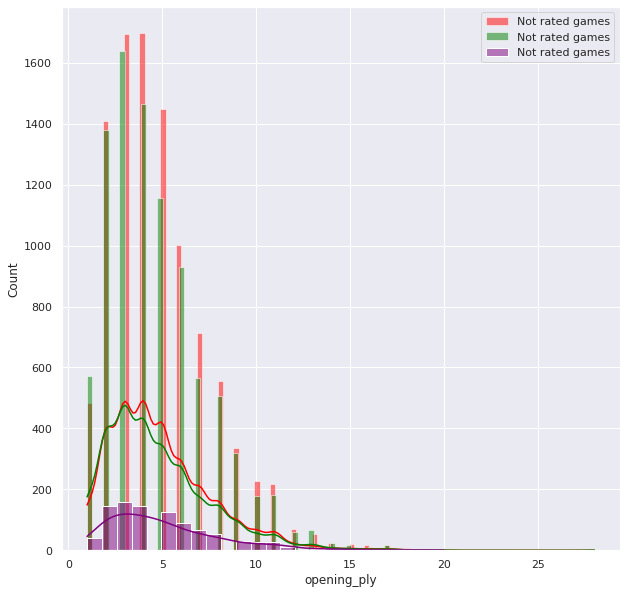

the mean for white wins :  4.86
the mean for black wins :  4.742
the mean for draw :  5.059


In [ ]:
#sns.set(style="darkgrid")
plt.figure(figsize=[10,10])

white_win=df[df['winner']== 'white']
black_win=df[df['winner']== 'black']
draw_win=df[df['winner']== 'draw']
#sns.histplot(white_win.opening_ply,label="opening duration",color="red")
#print("the mean is : ",white_win['opening_ply'].mean())

sns.histplot(data=df, x=df[df['winner']=='white']['opening_ply'], color="red", label="Not rated games",kde=True)
sns.histplot(data=df, x=df[df['winner']=='black']['opening_ply'], color="green", label="Not rated games",kde=True)
sns.histplot(data=df, x=df[df['winner']=='draw']['opening_ply'], color="purple", label="Not rated games", kde=True)
plt.legend() 
plt.show()
print("the mean for white wins : ",round(df[df['winner']=='white']['opening_ply'].mean(),3))
print("the mean for black wins : ",round(df[df['winner']=='black']['opening_ply'].mean(),3))
print("the mean for draw : ",round(df[df['winner']=='draw']['opening_ply'].mean(),3))

Did not find changes in opening_ply if the white player wins or not and almost same distribution.
found that when the game ends in draw the mean is silighty bigger

 Win rate between black and white

Text(0.5, 1.0, 'Victory status')

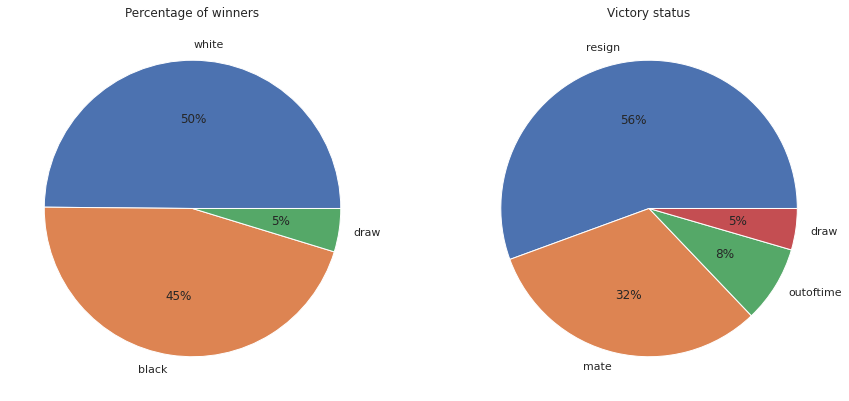

In [ ]:
plt.figure(figsize=[15,15])
labels= ['white', 'black' , 'draw' ]
plt.subplot(2,2,1)
plt.pie(df.winner.value_counts(), labels=labels,autopct='%.0f%%')
plt.title('Percentage of winners')
plt.subplot(2,2,2)
labels2= ['resign', 'mate', 'outoftime', 'draw']
plt.pie(df.victory_status.value_counts() , labels=labels2 ,autopct='%.0f%%')
plt.title('Victory status')

* The white players win 50% of the games and black 45%, there is slight advanaged for white players to win the 
* Most of the games wned in resign like said befor players prefer to resign when they see that the game is lost and not waist more time.

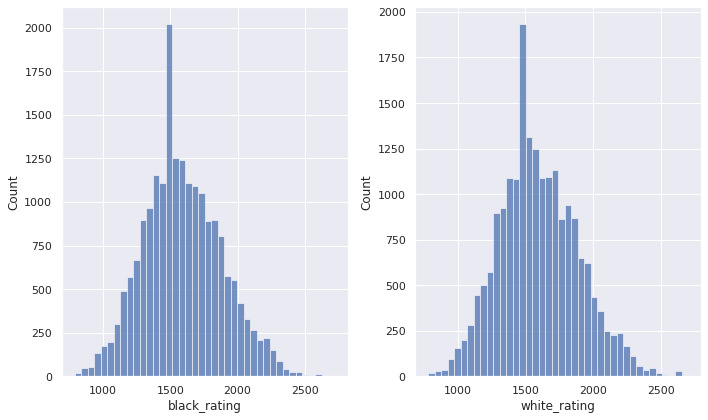

In [ ]:
plt.figure(figsize=[10,6])
plt.subplot(1, 2, 1)
sns.histplot(df.black_rating, bins=40, kde=False)
plt.subplot(1, 2, 2)
sns.histplot(df.white_rating, bins=40, kde=False)
plt.tight_layout()

We can see from this plot that most of the players have 1500 rating that is because new players start with 1500 and if they win they get higher rating and if they loose that lowers their rating.


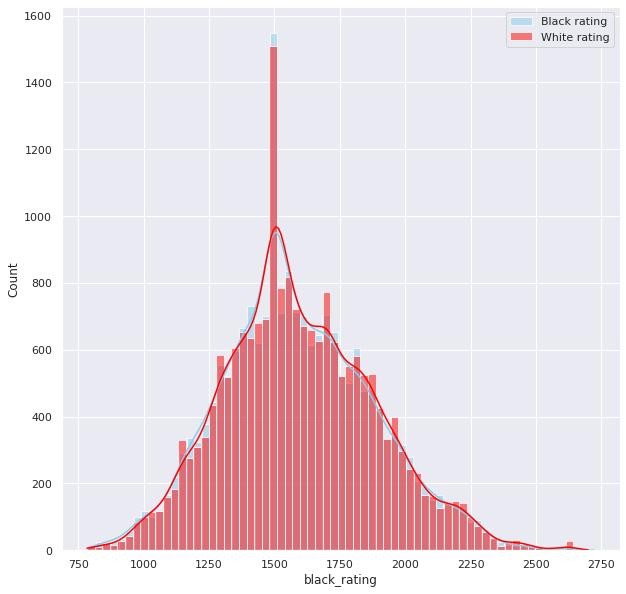

In [ ]:
sns.set(style="darkgrid")
plt.figure(figsize=[10,10])
sns.histplot(data=df, x="black_rating", color="skyblue", label="Black rating", kde=True)
sns.histplot(data=df, x="white_rating", color="red", label="White rating", kde=True)

plt.legend() 
plt.show()

We can see that the ranking of white and black players are almost identical that means most of the players play in both colors evenly

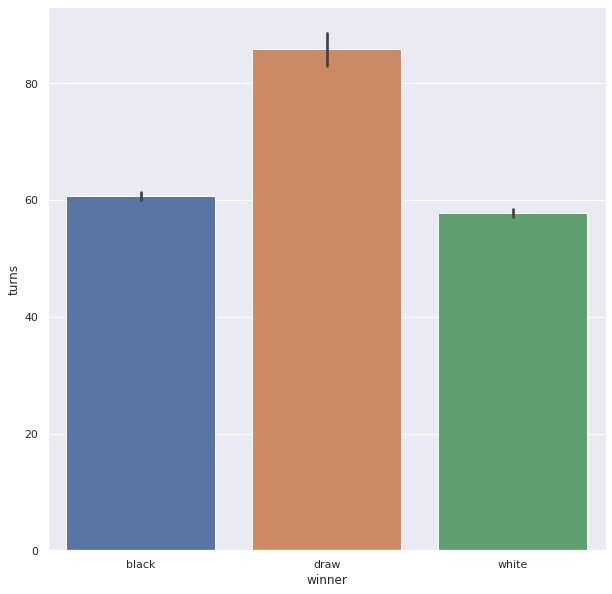

In [ ]:
plt.figure(figsize=[10,10])
sns.barplot(x='winner' , y='turns' , data=df)


plot that shows win type to number of turns
* we can see that the more turns happened when we had games that ended in draw
* when black wins we tend to have slightly more turns 



Correlation between rated games and turns number

In [ ]:
print('The mean turns in rated games',round(df[df['rated']==True]['turns'].mean(),3))
print('The mean turns in not rated games',round(df[df['rated']==False]['turns'].mean(),3))

The mean turns in rated games 61.903
The mean turns in not rated games 54.272


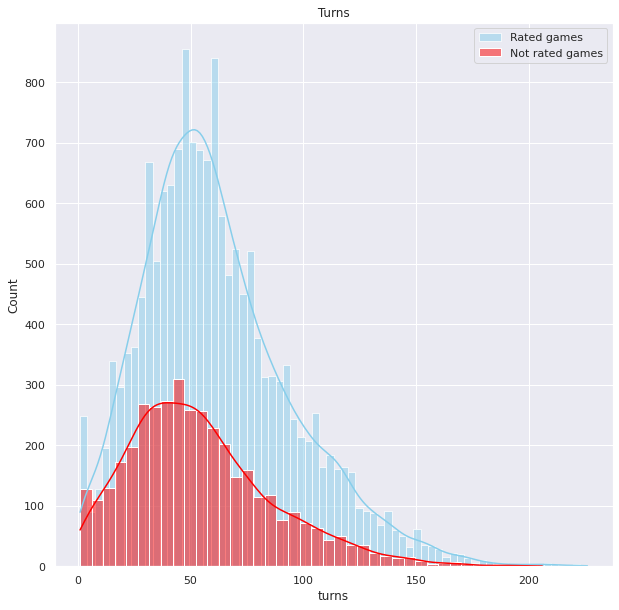

In [ ]:
sns.set(style="darkgrid")
plt.figure(figsize=[10,10])
sns.histplot(data=df, x=df[df['rated']==True]['turns'], color="skyblue", label="Rated games", kde=True).set(title=' Turns ')
sns.histplot(data=df, x=df[df['rated']==False]['turns'], color="red", label="Not rated games", kde=True)

plt.legend() 
plt.show()


But the distribution is the same with rated and not rated

Text(0.5, 1.0, 'not rated players')

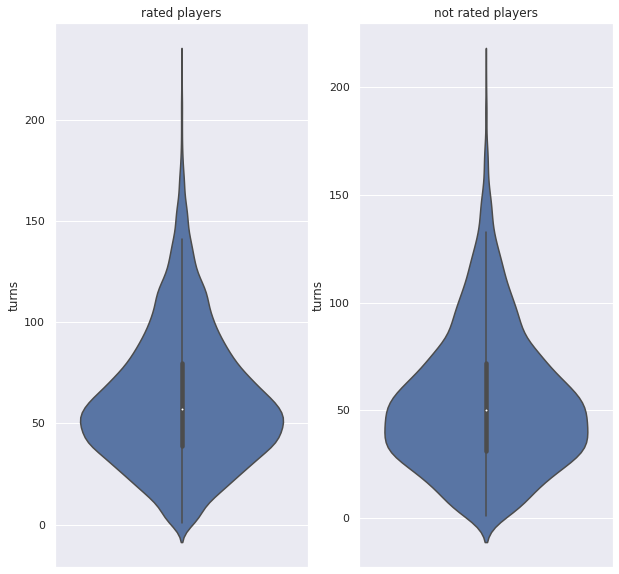

In [ ]:
plt.figure(figsize=[10,10])
plt.subplot(1, 2, 1)
fg=sns.violinplot(y='turns',data=df[df['rated']==True])  
fg.set_title('rated players')
plt.subplot(1, 2, 2)
fg1=sns.violinplot(y='turns',data=df[df['rated']==False])
fg1.set_title('not rated players')

We can see that not rated games have slightly more turns than rated games

## Featurs correlation

In [ ]:
df['rated'] = np.where(df['rated'] == True , 1 ,0)   #rated column for boolean to 1,0
df['winner'] = np.where(df['winner'] == 'white' , 1 , np.where(df['winner'] == 'black' ,-1,0 )) # winner from white/black/draw to 1,-1,0
df['victory_status']=df['victory_status'].factorize()[0]       # victory_status [0,1,2,3]  -> [outoftime ,resign,mate , draw]

In [ ]:
df.head(5)

,id,rated,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,opening_eco,opening_name,opening_ply,general_openings,rating_diff
0,TZJHLljE,0,13,0,1,15+2,bourgris,1500,a-00,1191,D10,Slav Defense: Exchange Variation,5,Slav Defense,309
1,l1NXvwaE,1,16,1,-1,5+10,a-00,1322,skinnerua,1261,B00,Nimzowitsch Defense: Kennedy Variation,4,Nimzowitsch Defense,61
2,mIICvQHh,1,61,2,1,5+10,ischia,1496,a-00,1500,C20,King's Pawn Game: Leonardis Variation,3,King's Pawn Game,-4
3,kWKvrqYL,1,61,2,1,20+0,daniamurashov,1439,adivanov2009,1454,D02,Queen's Pawn Game: Zukertort Variation,3,Queen's Pawn Game,-15
4,9tXo1AUZ,1,95,2,1,30+3,nik221107,1523,adivanov2009,1469,C41,Philidor Defense,5,Philidor Defense,54


                   rated     turns  ...  opening_ply  rating_diff
rated           1.000000  0.090481  ...    -0.002036    -0.034322
turns           0.090481  1.000000  ...     0.053975    -0.035907
victory_status -0.009440  0.114807  ...    -0.034073     0.003638
winner         -0.006768 -0.045406  ...     0.020391     0.360712
white_rating    0.003198  0.128888  ...     0.276962     0.428537
black_rating    0.032577  0.159723  ...     0.254907    -0.427029
opening_ply    -0.002036  0.053975  ...     1.000000     0.026024
rating_diff    -0.034322 -0.035907  ...     0.026024     1.000000

[8 rows x 8 columns]


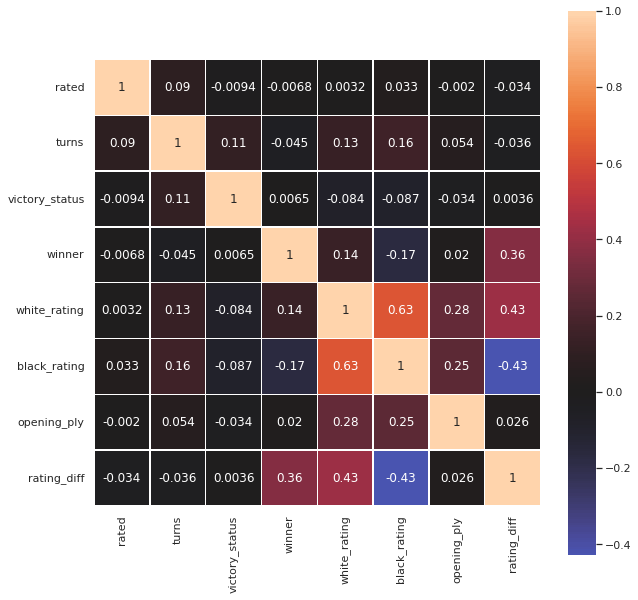

In [ ]:
corr=df.corr()
print(corr)

f, ax = plt.subplots(figsize=(10, 10))

sns.heatmap(corr,center=0,
           annot=True, square=True, linewidths=.5)

From this heat map plot we can see that we dont have any strong correlation between any feature and winner feature.

i will transform all category columns into numeric numbers so i can add the to the correlation matrix, hopefully i can find stronger correlation with the winner

In [ ]:
df.head(2)

,id,rated,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,opening_eco,opening_name,opening_ply,general_openings,rating_diff
0,TZJHLljE,0,13,0,1,15+2,bourgris,1500,a-00,1191,D10,Slav Defense: Exchange Variation,5,Slav Defense,309
1,l1NXvwaE,1,16,1,-1,5+10,a-00,1322,skinnerua,1261,B00,Nimzowitsch Defense: Kennedy Variation,4,Nimzowitsch Defense,61


In [ ]:
from sklearn.preprocessing import LabelEncoder
encoderr = LabelEncoder()
df['opening_eco'] = encoderr.fit_transform(df['opening_eco'])


In [ ]:
encoderrr = LabelEncoder()
df['general_openings'] = encoderr.fit_transform(df['general_openings'])
df['opening_name'] = encoderr.fit_transform(df['opening_name'])
df['increment_code'] = encoderr.fit_transform(df['increment_code'])

In [ ]:
df.head(2)

,id,rated,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,opening_eco,opening_name,opening_ply,general_openings,rating_diff
0,TZJHLljE,0,13,0,1,110,bourgris,1500,a-00,1191,248,1386,5,204,309
1,l1NXvwaE,1,16,1,-1,298,a-00,1322,skinnerua,1261,71,750,4,147,61


                     rated     turns  ...  general_openings  rating_diff
rated             1.000000  0.090481  ...         -0.006922    -0.034322
turns             0.090481  1.000000  ...          0.017568    -0.035907
victory_status   -0.009440  0.114807  ...         -0.000889     0.003638
winner           -0.006768 -0.045406  ...         -0.007841     0.360712
increment_code   -0.080662 -0.019314  ...         -0.022743     0.029288
white_rating      0.003198  0.128888  ...          0.016625     0.428537
black_rating      0.032577  0.159723  ...          0.027992    -0.427029
opening_eco       0.018582  0.027852  ...          0.090377     0.032805
opening_name     -0.004481  0.014829  ...          0.976069    -0.021636
opening_ply      -0.002036  0.053975  ...          0.031492     0.026024
general_openings -0.006922  0.017568  ...          1.000000    -0.013265
rating_diff      -0.034322 -0.035907  ...         -0.013265     1.000000

[12 rows x 12 columns]


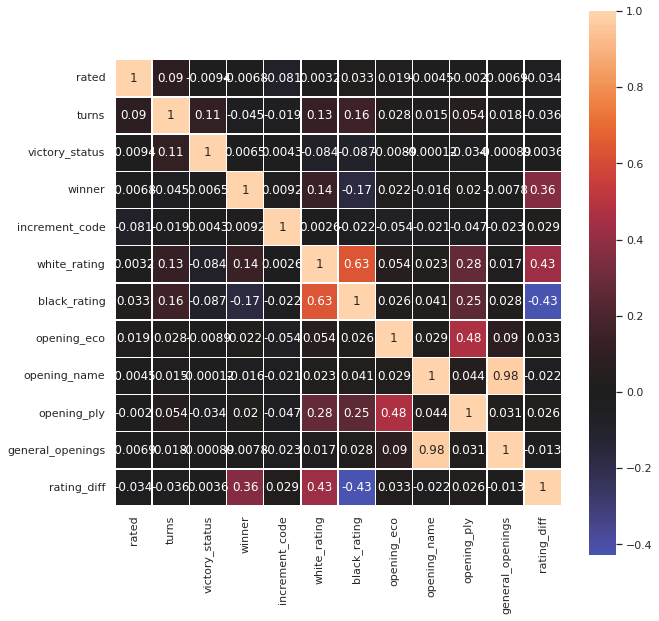

In [ ]:
corr=df.corr()
print(corr)

f, ax = plt.subplots(figsize=(10, 10))

sns.heatmap(corr,center=0,
           annot=True, square=True, linewidths=.5)

Still no stronge correlation between winner features and other features

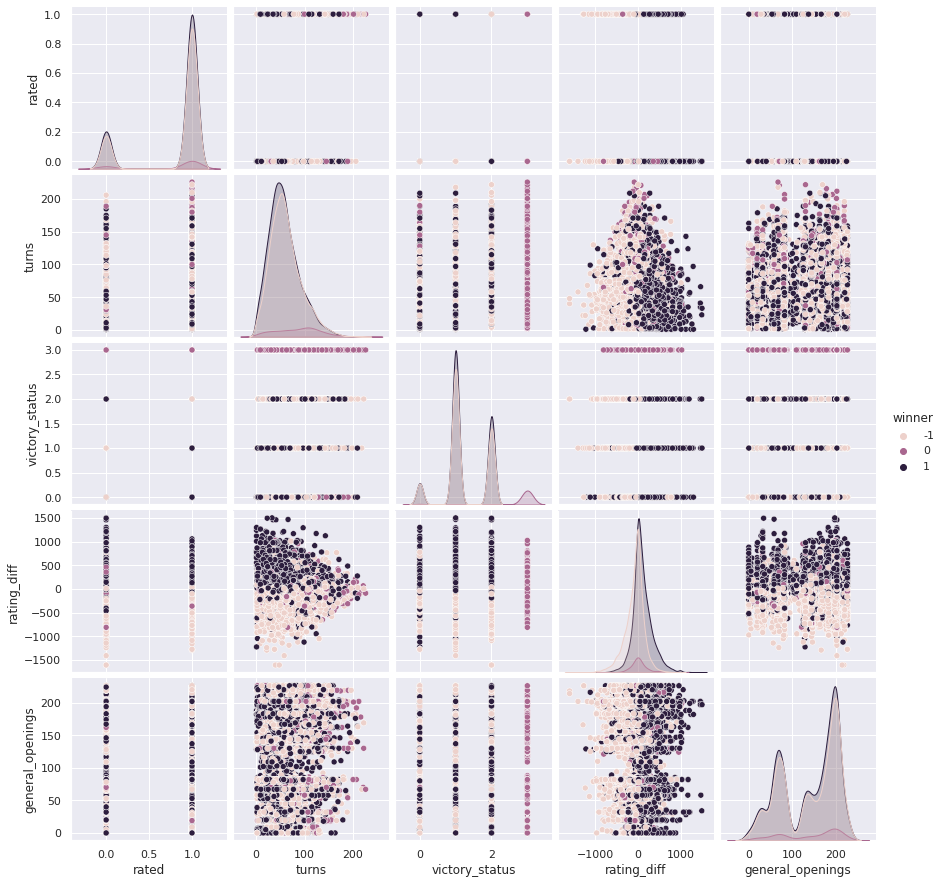

In [ ]:
features=df[['rated','turns','victory_status','rating_diff','general_openings','winner']]
sns.pairplot(features,hue='winner')
plt.show()

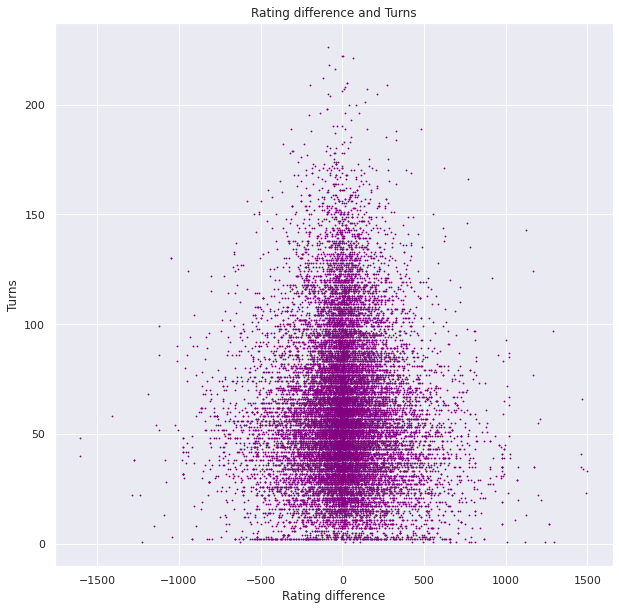

In [ ]:
plt.figure(figsize=[10,10])
plt.plot( 'rating_diff', 'turns', "", data=df, linestyle='', marker='o', markersize=0.8,color="purple")
plt.xlabel('Rating difference')
plt.ylabel('Turns')
plt.title('Rating difference and Turns')
plt.show()

We can see two things from this plot


1.    In most of the games the players had almost the same rank not more than 300-400 difference 
2.   The games with big rank difference tend to last less than games with rank difference close to 0, and that makes sense because if we have a good player with higher rank against a new player with low rank the game should not last long
and if we have two good player or bad player against each other the game can take longer  



# Classification Model

##  Naïve Bayes

I will split the data into 70% traning and 30% test using naive Bayes

In [ ]:
df3=df.copy()

In [ ]:
df3=df3.drop(['id','white_id','black_id'],axis=1)
df3=df3.drop('opening_eco',axis=1)

In [ ]:
y_chess=df3['winner']
x_chess=df3.drop('winner',axis=1)


In [ ]:
x_chess

,rated,turns,victory_status,increment_code,white_rating,black_rating,opening_name,opening_ply,general_openings,rating_diff
0,0,13,0,110,1500,1191,1386,5,204,309
1,1,16,1,298,1322,1261,750,4,147,61
2,1,61,2,298,1496,1500,650,3,130,-4
3,1,61,2,187,1439,1454,991,3,183,-15
4,1,95,2,247,1523,1469,783,5,162,54
...,...,...,...,...,...,...,...,...,...,...
20053,1,24,1,21,1691,1220,191,2,53,471
20054,1,82,2,19,1233,1196,959,2,182,37
20055,1,35,2,19,1219,1286,976,3,183,-67
20056,1,109,1,19,1360,1227,806,4,166,133


In [ ]:
from sklearn.model_selection import train_test_split 
Xtrain, Xtest, ytrain, ytest = train_test_split(x_chess, y_chess,
                                                random_state=1)

In [ ]:
from sklearn.naive_bayes import GaussianNB # 1. choose model class
model = GaussianNB()                       # 2. instantiate model
model.fit(Xtrain, ytrain)                  # 3. fit model to data
y_model = model.predict(Xtest)             # 4. predict on new data (output is numpy array)

ypred = pd.Series(y_model,name="prediction")
predicted = pd.concat([Xtest.reset_index(),ytest.reset_index(),ypred],axis=1)


In [ ]:
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
print('Using all featurs:  ',metrics.accuracy_score(ytest, y_model))

Using all featurs:   0.6671320303151177


In [ ]:
df3=df3[['rating_diff','victory_status']]
x_chess=df3


In [ ]:
from sklearn.model_selection import train_test_split 
Xtrain, Xtest, ytrain, ytest = train_test_split(x_chess, y_chess,
                                                random_state=1)

In [ ]:
from sklearn.naive_bayes import GaussianNB # 1. choose model class
model = GaussianNB()                       # 2. instantiate model
model.fit(Xtrain, ytrain)                  # 3. fit model to data
y_model = model.predict(Xtest)             # 4. predict on new data (output is numpy array)

ypred = pd.Series(y_model,name="prediction")
predicted = pd.concat([Xtest.reset_index(),ytest.reset_index(),ypred],axis=1)


In [ ]:
print('After using two featurs:  ',metrics.accuracy_score(ytest, y_model))

After using two featurs:   0.6697247706422018


We can see that with 2 features we got better results

In [ ]:
def bayes_plot(df,model="gnb",spread=30):
    df.dropna()
    colors = 'seismic'
    col1 = df.columns[0]
    col2 = df.columns[1]
    target = df.columns[2]
    sns.scatterplot(data=df, x=col1, y=col2,hue=target)
    plt.show()
    y = df[target]  # Target variable
    X = df.drop(target, axis=1)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=1)  # 70% training and 30% test

    clf = GaussianNB()
    if (model != "gnb"):
        clf = DecisionTreeClassifier(max_depth=model)
    clf = clf.fit(X_train, y_train)
    
    # Train Classifer
    

    prob = len(clf.classes_) == 2

    # Predict the response for test dataset

    y_pred = clf.predict(X_test)
    print(metrics.classification_report(y_test, y_pred))

    hueorder = clf.classes_
    def numify(val):
        return np.where(clf.classes_ == val)[0]

    Y = y.apply(numify)
    x_min, x_max = X.loc[:, col1].min() - 1, X.loc[:, col1].max() + 1
    y_min, y_max = X.loc[:, col2].min() - 1, X.loc[:, col2].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.2),
                         np.arange(y_min, y_max, 0.2))

    Z = clf.predict_proba(np.c_[xx.ravel(), yy.ravel()])
    if prob:

        Z = Z[:,1]-Z[:,0]
    else:
        colors = "Set1"
        Z = np.argmax(Z, axis=1)


    # Put the result into a color plot
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, cmap=colors, alpha=0.5)
    plt.colorbar()
    if not prob:
        plt.clim(0,len(clf.classes_)+3)
    sns.scatterplot(data=df[::spread], x=col1, y=col2, hue=target, hue_order=hueorder,palette=colors)
    fig = plt.gcf()
    fig.set_size_inches(12, 8)
    plt.show()

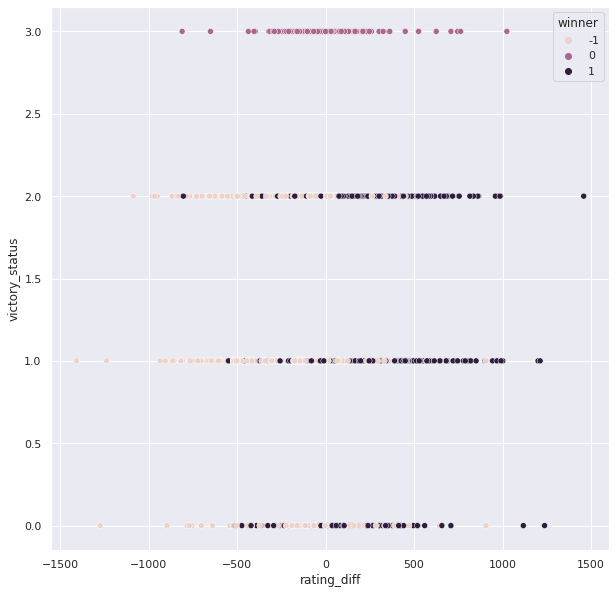

              precision    recall  f1-score   support

          -1       0.68      0.60      0.64       717
           0       1.00      0.95      0.97        73
           1       0.64      0.72      0.68       715

    accuracy                           0.67      1505
   macro avg       0.77      0.76      0.76      1505
weighted avg       0.68      0.67      0.67      1505



/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"


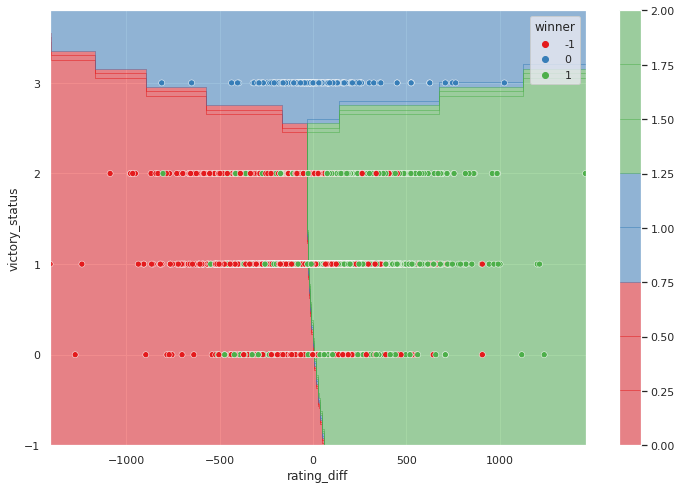

In [ ]:
plt.figure(figsize=[10,10])
bayes_plot(pd.concat([Xtest,ytest],axis=1),spread=1)   # winner [1,0,-1] -> white/draw/black 
                                                       #  victory_status [0,1,2,3]  -> [outoftime ,resign,mate , draw]

We can see that we have an a accuracy 67% 

## Decision Tree

I will split the data into 70% training and 30% test using Decision tree

### Decision Tree with default featurs

In [ ]:
df_Tree= pd.read_csv("/gdrive/MyDrive/shenkar/3rd year/python/games.csv")

In [ ]:
df_Tree.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20058 entries, 0 to 20057
Data columns (total 16 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              20058 non-null  object 
 1   rated           20058 non-null  bool   
 2   created_at      20058 non-null  float64
 3   last_move_at    20058 non-null  float64
 4   turns           20058 non-null  int64  
 5   victory_status  20058 non-null  object 
 6   winner          20058 non-null  object 
 7   increment_code  20058 non-null  object 
 8   white_id        20058 non-null  object 
 9   white_rating    20058 non-null  int64  
 10  black_id        20058 non-null  object 
 11  black_rating    20058 non-null  int64  
 12  moves           20058 non-null  object 
 13  opening_eco     20058 non-null  object 
 14  opening_name    20058 non-null  object 
 15  opening_ply     20058 non-null  int64  
dtypes: bool(1), float64(2), int64(4), object(9)
memory usage: 2.3+ MB


In [ ]:
df_Tree.describe()

,created_at,last_move_at,turns,white_rating,black_rating,opening_ply
count,2.005800e+04,2.005800e+04,20058.000000,20058.000000,20058.000000,20058.000000
mean,1.483617e+12,1.483618e+12,60.465999,1596.631868,1588.831987,4.816981
std,2.850151e+10,2.850140e+10,33.570585,291.253376,291.036126,2.797152
min,1.376772e+12,1.376772e+12,1.000000,784.000000,789.000000,1.000000
25%,1.477548e+12,1.477548e+12,37.000000,1398.000000,1391.000000,3.000000
50%,1.496010e+12,1.496010e+12,55.000000,1567.000000,1562.000000,4.000000
75%,1.503170e+12,1.503170e+12,79.000000,1793.000000,1784.000000,6.000000
max,1.504493e+12,1.504494e+12,349.000000,2700.000000,2723.000000,28.000000


convert the features to numeric features 

In [ ]:

encoder = LabelEncoder()
df_Tree['rated'] = encoder.fit_transform(df_Tree['rated'])
df_Tree['victory_status'] = encoder.fit_transform(df_Tree['victory_status'])
df_Tree['winner']=df_Tree['winner'].astype('category')
df_Tree['increment_code'] = encoder.fit_transform(df_Tree['increment_code'])
df_Tree['opening_eco'] = encoder.fit_transform(df_Tree['opening_eco'])
df_Tree['opening_name'] = encoder.fit_transform(df_Tree['opening_name'])
df_Tree['opening_ply'] = encoder.fit_transform(df_Tree['opening_ply'])
df_Tree['moves'] = encoder.fit_transform(df_Tree['moves'])
df_Tree['id'] = encoder.fit_transform(df_Tree['id'])
df_Tree['white_id'] = encoder.fit_transform(df_Tree['white_id'])
df_Tree['black_id'] = encoder.fit_transform(df_Tree['black_id'])

In [ ]:
X_tree = df_Tree.drop('winner',axis=1)
y_tree = df_Tree['winner']

In [ ]:

X_train, X_test, y_train, y_test = train_test_split(X_tree, y_tree, test_size=0.3,random_state=1)  # 70% training and 30% test
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       black       0.59      0.58      0.59      2747
        draw       0.96      0.96      0.96       275
       white       0.62      0.63      0.63      2996

    accuracy                           0.62      6018
   macro avg       0.72      0.73      0.73      6018
weighted avg       0.62      0.62      0.62      6018



Using all featurs in the dataset gave us 63% accuracy

### Decision Tree with clean data

In [ ]:
df_Tree2=df
df_Tree2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20054 entries, 0 to 20057
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   id                20054 non-null  object
 1   rated             20054 non-null  int64 
 2   turns             20054 non-null  int64 
 3   victory_status    20054 non-null  int64 
 4   winner            20054 non-null  int64 
 5   increment_code    20054 non-null  int64 
 6   white_id          20054 non-null  object
 7   white_rating      20054 non-null  int64 
 8   black_id          20054 non-null  object
 9   black_rating      20054 non-null  int64 
 10  opening_eco       20054 non-null  int64 
 11  opening_name      20054 non-null  int64 
 12  opening_ply       20054 non-null  int64 
 13  general_openings  20054 non-null  int64 
 14  rating_diff       20054 non-null  int64 
dtypes: int64(12), object(3)
memory usage: 3.0+ MB


In [ ]:

win={1:'white' , 0:'draw' , -1:'black'}
df_Tree2['winner'] = df_Tree2['winner'].map(win)
cat = ['white', 'draw', 'black']
df_Tree2['winner'] = pd.Categorical(df_Tree2['winner'], categories=cat, ordered=False)


changing winner from numeric to categorical

In [ ]:
df_Tree2.head()

,id,rated,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,opening_eco,opening_name,opening_ply,general_openings,rating_diff
0,TZJHLljE,0,13,0,white,110,bourgris,1500,a-00,1191,248,1386,5,204,309
1,l1NXvwaE,1,16,1,black,298,a-00,1322,skinnerua,1261,71,750,4,147,61
2,mIICvQHh,1,61,2,white,298,ischia,1496,a-00,1500,171,650,3,130,-4
3,kWKvrqYL,1,61,2,white,187,daniamurashov,1439,adivanov2009,1454,241,991,3,183,-15
4,9tXo1AUZ,1,95,2,white,247,nik221107,1523,adivanov2009,1469,192,783,5,162,54


In [ ]:
df_Tree2['rated'] = encoder.fit_transform(df_Tree2['rated'])
df_Tree2['victory_status'] = encoder.fit_transform(df_Tree2['victory_status'])
df_Tree2['winner']=df_Tree2['winner'].astype('category')        # change winner to category
df_Tree2['increment_code'] = encoder.fit_transform(df_Tree2['increment_code'])
df_Tree2['id'] = encoder.fit_transform(df_Tree2['id'])
df_Tree2['white_id'] = encoder.fit_transform(df_Tree2['white_id'])
df_Tree2['black_id'] = encoder.fit_transform(df_Tree2['black_id'])


In [ ]:
df_Tree2.head(6)

,id,rated,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,opening_eco,opening_name,opening_ply,general_openings,rating_diff
0,9068,0,13,0,white,110,1287,1500,11,1191,248,1386,5,204,309
1,14511,1,16,1,black,298,16,1322,7746,1261,71,750,4,147,61
2,14903,1,61,2,white,298,3823,1496,11,1500,171,650,3,130,-4
3,14349,1,61,2,white,187,2017,1439,134,1454,241,991,3,183,-15
4,3091,1,95,2,white,247,6056,1523,134,1469,192,783,5,162,54
5,7069,0,5,3,draw,19,8568,1250,3065,1002,96,1291,4,202,248


In [ ]:
X_tree2 = df_Tree2.drop('winner',axis=1)
y_tree2 = df_Tree2['winner']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_tree2, y_tree2, test_size=0.3,random_state=1)  # 70% training and 30% test
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       black       0.62      0.61      0.62      2805
        draw       0.96      0.97      0.96       264
       white       0.63      0.64      0.64      2948

    accuracy                           0.64      6017
   macro avg       0.74      0.74      0.74      6017
weighted avg       0.64      0.64      0.64      6017



Using clean and manipulated data give us 64% accuracy

Sort features by importance - gives the best results

In [ ]:
importances = pd.DataFrame({'feature':X_train.columns,'importance':np.round(clf.feature_importances_,3)})
importances = importances.sort_values('importance',ascending=False)
importances

,feature,importance
13,rating_diff,0.192
2,turns,0.144
3,victory_status,0.137
7,black_id,0.083
5,white_id,0.075
0,id,0.063
9,opening_eco,0.056
6,white_rating,0.054
10,opening_name,0.053
8,black_rating,0.050


This list of the most relative features sorted from the most important to the least,  so we are going to take most 3 features 

In [ ]:
X_tree2=df_Tree2[['turns','rating_diff','victory_status']]

In [ ]:
from sklearn.tree import DecisionTreeClassifier

max_depth_range = list(range(1, 15,1))
accuracy = []
for depth in max_depth_range:
    
    clf = DecisionTreeClassifier(max_depth = depth, 
                             random_state = 0)
    clf.fit(X_train, y_train)
    score = clf.score(X_test, y_test)
    accuracy.append(score)

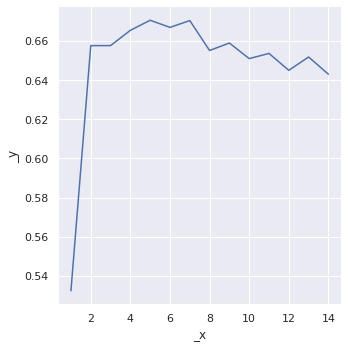

In [ ]:
sns.relplot(x=max_depth_range, y=accuracy, kind="line")

We can see that the depth with the best result is 5

Using desicion tree without max_depth

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_tree2, y_tree2, test_size=0.3,random_state=1)  # 70% training and 30% test
clf = DecisionTreeClassifier()
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print(metrics.classification_report(y_test, y_pred))



              precision    recall  f1-score   support

       black       0.73      0.73      0.73      2805
        draw       0.95      0.97      0.96       264
       white       0.75      0.74      0.74      2948

    accuracy                           0.75      6017
   macro avg       0.81      0.81      0.81      6017
weighted avg       0.75      0.75      0.75      6017



In [ ]:
from io import StringIO
import pydotplus
from IPython.display import Image
from sklearn.tree import export_graphviz

dot_data=StringIO()
export_graphviz(clf,out_file=dot_data,filled=True,rounded=True,feature_names=X_tree2.columns,class_names=clf.classes_)
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Tree_Nodepth.png')
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.258588 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.258588 to fit



Using desision tree with max depth = 5

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_tree2, y_tree2, test_size=0.3,random_state=1)  # 70% training and 30% test
clf = DecisionTreeClassifier(max_depth=5)
clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)

print(metrics.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       black       0.64      0.67      0.66      2805
        draw       1.00      0.97      0.98       264
       white       0.67      0.65      0.66      2948

    accuracy                           0.67      6017
   macro avg       0.77      0.76      0.77      6017
weighted avg       0.67      0.67      0.67      6017



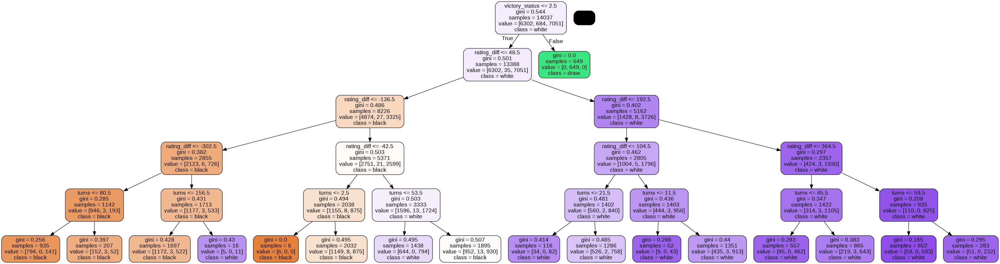

In [ ]:
from io import StringIO
import pydotplus
from IPython.display import Image
from sklearn.tree import export_graphviz

dot_data=StringIO()
export_graphviz(clf,out_file=dot_data,filled=True,rounded=True,feature_names=X_tree2.columns,class_names=clf.classes_)
graph=pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('Tree_withDepth.png')
Image(graph.create_png())


we can see that when we add max depth we have less accuracy but it requires significantly less computing power it took a few minuts to run the tree without depth

Accuracy without max depth is 75%
Accuracy with max depth of 5 is 67%

# Summary

This dataset didnt have a lot of missing data, but it had some corropted data in the create_at and last_move_at so i had to delete them,and that left me with 14 featurs including 3 ID featurs, in my openion that is not enugh to make good predictions and make more in depth analysis 

* Desision tree accuracy without depth limit was 75%
* Desision tree accuracy with depth limit of 5 was 67%
* Naïve Bayes accuracy was 66%

we can see that using Desision tree gives better results 